In [ ]:
from pathlib import Path
import pandas as pd

data_root = Path('aptos2019-blindness-detection')

train_imgs_dir = data_root / 'train_images'
test_imgs_dir = data_root / 'test_images'

train_labels = pd.read_csv(data_root / 'train.csv')

In [21]:
from torch.utils.data import Dataset
from PIL import Image
from torchvision import transforms

class TrainDataset(Dataset):
    def __init__(self, labels_df, img_dir, transform=None):
        """
        Args:
            labels_df (pd.DataFrame): DataFrame with columns ['id_code', 'diagnosis']
            img_dir (Path): Directory where images are stored
            transform (callable, optional): Transform to apply to images
        """
        self.labels_df = labels_df
        self.img_dir = img_dir
        self.transform = transform if transform is not None else transforms.ToTensor()

    def __len__(self):
        return len(self.labels_df)

    def __getitem__(self, idx):
        row = self.labels_df.iloc[idx]
        img_path = self.img_dir / f"{row['id_code']}.png"
        image = Image.open(img_path).convert('RGB')  # ensure 3 channels
        label = int(row['diagnosis'])

        if self.transform:
            image = self.transform(image)

        return transforms.ToTensor()(image), label

In [2]:
from PIL import Image, ImageOps
import numpy as np
import cv2
# from torch.utils.data import DataLoader
import math, random

class TrimAndPad:
    def __init__(self, width=224, height=224, black_thresh=15, speckle_size=10):
        """
        Args:
            width (int): target output width
            height (int): target output height
            black_thresh (int): grayscale threshold below which pixels are "black"
            speckle_size (int): kernel size for removing small speckles
        """
        self.width = width
        self.height = height
        self.black_thresh = black_thresh
        # OpenCV structuring element for opening
        self.kernel = cv2.getStructuringElement(
            cv2.MORPH_RECT, (speckle_size, speckle_size)
        )

    def __call__(self, img: Image.Image):
        # 1) Convert to gray OpenCV image
        gray = np.array(img.convert("L"))

        # 2) Binary threshold
        _, mask = cv2.threshold(
            gray,
            self.black_thresh,
            255,
            cv2.THRESH_BINARY
        )

        # 3) Morphological opening to kill tiny speckles
        clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, self.kernel)

        # 4) Find nonzero coords and crop to bbox
        coords = cv2.findNonZero(clean)
        if coords is not None:
            x, y, w, h = cv2.boundingRect(coords)
            img = img.crop((x, y, x + w, y + h))

        # 5) Pad (aspect‐ratio preserving) to desired size
        img = ImageOps.pad(
            img,
            (self.width, self.height),
            color=(0, 0, 0),
            centering=(0.5, 0.5)
        )
        
        return img

trim_and_pad = TrimAndPad(width=2048, height=2048)

In [ ]:
class RandomSafeRotate:
    def __init__(self, max_rotate=45.0, resample=Image.BICUBIC, orig_size=True):
        """
        Args:
            max_rotate (float): maximum absolute rotation angle in degrees
            resample: PIL resampling filter to use during rotation
        """
        self.max_rotate = max_rotate
        self.resample   = resample
        self.orig_size  = orig_size

    def __call__(self, img: Image.Image) -> Image.Image:
        # 1) get original dimensions
        w, h = img.size

        # 2) compute worst-case bounding box dims for ±max_rotate
        θ = math.radians(self.max_rotate)
        Wp = int(math.ceil(abs(w * math.cos(θ)) + abs(h * math.sin(θ))))
        Hp = int(math.ceil(abs(w * math.sin(θ)) + abs(h * math.cos(θ))))

        # 3) figure out how much padding is needed on each side
        pad_left  = (Wp - w) // 2
        pad_top   = (Hp - h) // 2
        pad_right = Wp - w - pad_left
        pad_bot   = Hp - h - pad_top

        # 4) pad the image with black so rotation never crops content
        img = ImageOps.expand(img,
                              border=(pad_left, pad_top, pad_right, pad_bot),
                              fill=0)

        # 5) pick a random angle in [-max_rotate, +max_rotate]
        angle = random.uniform(-self.max_rotate, self.max_rotate)

        # 6) rotate, keeping background black
        img = img.rotate(angle,
                         resample=self.resample,
                         fillcolor=0)
        
        # 7) center-crop back down to the original (w, h)
        # if self.orig_size:
        #     img = ImageOps.fit(img, (w, h), centering=(0.5, 0.5))

        return img

rotate = RandomSafeRotate()
transform = transforms.Compose([
    trim_and_pad,
    transforms.RandomRotation(
        degrees=(0, 360),
        interpolation=Image.BICUBIC,
        expand=False,
        fill=0
    )
])

train_dataset = TrainDataset(train_labels, train_imgs_dir, transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=10, shuffle=True)

NameError: name 'transforms' is not defined

In [ ]:
import torch

images_list, labels_list = [], []
dataloader_iter = iter(train_dataloader)

N = 20

while len(images_list) == 0 or torch.cat(images_list).size(0) < N:
    try:
        images_batch, labels_batch = next(dataloader_iter)
        images_list.append(images_batch)
        labels_list.append(labels_batch)
    except StopIteration:
        dataloader_iter = iter(train_dataloader)  # Restart if we hit the end
        continue

# Concatenate all collected images/labels and trim to exactly N
all_images = torch.cat(images_list)[:N]
all_labels = torch.cat(labels_list)[:N]

cols = 3
rows = (N + cols - 1) // cols  # ceil

# get height/width from your tensor
_, _, H, W = all_images.shape  # shape is (N, C, H, W)
dpi = 100
figsize = (cols * W / dpi, rows * H / dpi)
fig, axes = plt.subplots(
    rows, cols,
    figsize=figsize,
    dpi=dpi,
    gridspec_kw={'hspace': 0, 'wspace': 0}
)

for idx, ax in enumerate(axes.flatten()):
    if idx < N:
        img = all_images[idx].cpu().permute(1, 2, 0).numpy()
        ax.imshow(img)
        ax.text(
            0.01, 0.99,
            str(all_labels[idx].item()),
            transform=ax.transAxes,
            color='white',
            fontsize=8,
            fontweight='bold',
            va='top',
            ha='left',
            backgroundcolor='black',
            alpha=0.7
        )
    ax.axis('off')

# remove any figure margins
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.show()

===========================================

In [25]:
import cv2
import numpy as np
import os
from pathlib import Path
from skimage.measure import ransac, CircleModel
import matplotlib.pyplot as plt

def normalize_brightness_contrast(img, corner_size=5):
    # 1) Determine black point from the four corners
    h, w = img.shape[:2]
    corners = [
        img[0:corner_size,           0:corner_size],
        img[0:corner_size,           w-corner_size:w],
        img[h-corner_size:h,         0:corner_size],
        img[h-corner_size:h,         w-corner_size:w],
    ]
    # grayscale those patches to get a robust black level
    if img.ndim == 3:
        gray_p = [cv2.cvtColor(p, cv2.COLOR_BGR2GRAY) for p in corners]
    else:
        gray_p = corners
    black_point = float(np.median(np.hstack([p.flatten() for p in gray_p])))

    # 2) Find the absolute maximum pixel value
    #    (for grayscale or for overall intensity of color,
    #     we use the max of the gray‐converted image)
    if img.ndim == 3:
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        img_gray = img
    max_val = float(img_gray.max())

    # 3) Compute α and β so that:
    #      new = α * old + β
    #    maps old = black_point → 0
    #         old = max_val     → max_val (i.e. unchanged)
    if max_val <= black_point:
        # degenerate case: everything at or below black_point
        α = 1.0
        β = -black_point
    else:
        α = max_val / (max_val - black_point)
        β = - black_point * α

    # 4) Apply the same linear transform to all channels
    img = cv2.convertScaleAbs(img, alpha=α, beta=β)

    return img

def detect_retina_boundary(img, boundary_margin=5, min_radius=100, debug=False, excluded_quadrants=None):
    """
    Detect the circular boundary of a retina in an image with black background,
    excluding points at the image boundaries.
    
    Parameters:
    - img: Image
    - boundary_margin: Margin from image edges to exclude points (in pixels)
    - min_radius: Minimum expected radius of the retina in pixels
    - debug: Whether to display debug visualization
    - excluded_quadrants: Optional list/set of integers from {1,2,3,4} to exclude contour
                          points from specific quadrants (1: top-left, 2: top-right, 
                          3: bottom-right, 4: bottom-left)
    
    Returns:
    - center_x, center_y: Coordinates of the circle center
    - radius: Radius of the circle
    """    
    # Get image dimensions
    height, width = img.shape[:2]
    
    # Define helper function to determine quadrant
    def get_quadrant(x, y):
        if x < width / 2:
            if y < height / 2:
                return 1  # top-left
            else:
                return 4  # bottom-left
        else:
            if y < height / 2:
                return 2  # top-right
            else:
                return 3  # bottom-right
    
    # Convert to grayscale if not already
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img.copy()
    
    # Apply a threshold to separate retina from black background
    _, binary = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY)
    
    # Find contours
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    
    if not contours:
        raise ValueError("No contours found in the image")
    
    # Get the largest contour (should be the retina boundary)
    main_contour = max(contours, key=cv2.contourArea)
    
    # Extract points from the contour for circle fitting
    boundary_points = main_contour.reshape(-1, 2)
    
    # *** Critical Step: Filter out points that are near the image boundaries ***
    filtered_points = []
    for point in boundary_points:
        x, y = point
        # Check if the point is not close to any image boundary
        if (boundary_margin < x < width - boundary_margin and 
            boundary_margin < y < height - boundary_margin):
            filtered_points.append(point)
    
    filtered_points = np.array(filtered_points)
    
    # Further filter points by excluding specified quadrants
    if excluded_quadrants:
        filtered_points = np.array([point for point in filtered_points 
                                  if get_quadrant(point[0], point[1]) not in excluded_quadrants])
    
    if debug:
        # Draw debug visualization
        debug_img = img.copy()
        
        # Draw all contour points
        for point in boundary_points:
            x, y = point
            if not (boundary_margin < x < width - boundary_margin and 
                    boundary_margin < y < height - boundary_margin):
                # Point is near the boundary
                cv2.circle(debug_img, (x, y), 2, (0, 255, 255), -1)  # Yellow
            elif excluded_quadrants and (get_quadrant(x, y) in excluded_quadrants):
                # Point is in excluded quadrant
                cv2.circle(debug_img, (x, y), 2, (255, 0, 0), -1)  # Blue
            else:
                # Point is used for fitting
                cv2.circle(debug_img, (x, y), 2, (0, 255, 0), -1)  # Green
        
        # Draw image boundary margin
        cv2.rectangle(debug_img, 
                      (boundary_margin, boundary_margin), 
                      (width - boundary_margin, height - boundary_margin), 
                      (255, 255, 0), 1)  # Yellow
        
        plt.figure(figsize=(12, 12))
        plt.imshow(cv2.cvtColor(debug_img, cv2.COLOR_BGR2RGB))
        plt.title('Boundary Points (Red: All, Green: Filtered for Circle Fitting)')
        plt.show()
    
    # Check if we have enough filtered points
    if len(filtered_points) < 5:  # Need more points for stable fitting
        # If not enough non-boundary points, we need a fallback strategy
        # print("Warning: Not enough non-boundary points. Using all points with edge weighting.")
        # Use all points but give less weight to edge points in the RANSAC algorithm
        filtered_points = boundary_points
    
    # Use RANSAC to robustly fit a circle to the boundary points
    model, inliers = ransac(filtered_points, CircleModel, 
                          min_samples=5,  # Use more points for stability
                          residual_threshold=3.0,  # Adjust based on your images
                          max_trials=3000)  # More trials for better fitting
    
    # Extract circle parameters
    xc, yc, r = model.params
    
    if debug:
        # Draw the fitted circle
        circle_img = img.copy()
        cv2.circle(circle_img, (int(xc), int(yc)), int(r), (0, 0, 255), 2)
        
        # Mark center
        cv2.circle(circle_img, (int(xc), int(yc)), 5, (255, 0, 0), -1)
        
        # Mark inlier points in green and outliers in red
        for i, point in enumerate(filtered_points):
            if i < len(inliers):  # Check if this point has an inlier status
                color = (0, 255, 0) if inliers[i] else (255, 0, 0)
                cv2.circle(circle_img, tuple(point), 3, color, -1)
        
        plt.figure(figsize=(12, 12))
        plt.imshow(cv2.cvtColor(circle_img, cv2.COLOR_BGR2RGB))
        plt.title(f'Fitted Circle: Center=({xc:.1f}, {yc:.1f}), Radius={r:.1f}')
        plt.show()
    
    return xc, yc, r

def detect_retina_bump(img, center_x, center_y, radius, threshold=10, debug=False):
    """
    Detect the bump on the retina that extends beyond the circular boundary.
    
    Parameters:
    - img: Input image
    - center_x, center_y: Circle center coordinates
    - radius: Circle radius
    - threshold: Threshold for bump detection
    - debug: Whether to display debug visualization
    
    Returns:
    - bump_mask: Binary mask of the detected bump
    """
    # Convert to grayscale if needed
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img.copy()
    
    # Create a circular mask for the regular part of the retina
    height, width = gray.shape[:2]
    y_grid, x_grid = np.ogrid[:height, :width]
    dist_from_center = np.sqrt((x_grid - center_x)**2 + (y_grid - center_y)**2)
    
    # Create mask: True for points outside the circle but still part of the retina
    circle_mask = dist_from_center <= radius
    
    # Apply threshold to get retina pixels
    _, binary = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)
    
    # Find pixels that are outside the circle but still part of the retina (the bump)
    bump_mask = np.logical_and(binary > 0, ~circle_mask)
    
    if debug:
        # Create debug visualization
        debug_img = img.copy() if len(img.shape) == 3 else cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        
        # Draw fitted circle
        cv2.circle(debug_img, (int(center_x), int(center_y)), int(radius), (0, 0, 255), 2)
        
        # Color bump areas
        bump_pixels = np.where(bump_mask)
        for y, x in zip(bump_pixels[0], bump_pixels[1]):
            debug_img[y, x] = [0, 255, 255]  # Yellow
        
        plt.figure(figsize=(12, 12))
        plt.imshow(cv2.cvtColor(debug_img, cv2.COLOR_BGR2RGB))
        plt.title('Detected Bump (Yellow)')
        plt.show()
    
    return bump_mask

def expand_image_to_fit_circle(img, center_x, center_y, radius):
    """
    Expand the image to fit the full circle.
    
    Parameters:
    - img: Input image
    - center_x, center_y: Circle center coordinates
    - radius: Circle radius
    
    Returns:
    - expanded_img: Expanded image
    - new_center_x, new_center_y: Updated center coordinates in the expanded image
    """
    height, width = img.shape[:2]
    
    # Calculate target bounding box
    min_x = int(round(center_x - radius))
    max_x = int(round(center_x + radius))
    min_y = int(round(center_y - radius))
    max_y = int(round(center_y + radius))
    
    # Amount of expansion needed on each side
    expand_left = max(0, -min_x)
    expand_top = max(0, -min_y)
    expand_right = max(0, max_x - width)
    expand_bottom = max(0, max_y - height)
    
    # New canvas size
    new_width = width + expand_left + expand_right
    new_height = height + expand_top + expand_bottom
    
    # Create black canvas
    if len(img.shape) == 3:
        expanded_img = np.zeros((new_height, new_width, 3), dtype=img.dtype)
    else:
        expanded_img = np.zeros((new_height, new_width), dtype=img.dtype)
    
    # Paste original image into expanded canvas
    expanded_img[expand_top:expand_top+height, expand_left:expand_left+width] = img
    
    # Update center coordinates
    new_center_x = center_x + expand_left
    new_center_y = center_y + expand_top
    
    # Now crop to exactly the bounding box of the circle
    crop_min_x = int(round(new_center_x - radius))
    crop_max_x = int(round(new_center_x + radius))
    crop_min_y = int(round(new_center_y - radius))
    crop_max_y = int(round(new_center_y + radius))
    
    final_img = expanded_img[crop_min_y:crop_max_y, crop_min_x:crop_max_x]
    
    # Sanity check: make sure final image is square
    assert abs(final_img.shape[0] - final_img.shape[1]) < 2, f"Final image not square: {final_img.shape}"

    # New center is at (radius, radius) in the cropped image
    final_center_x = radius
    final_center_y = radius
    
    return final_img, final_center_x, final_center_y

def process_retina_image(image_path, output_path=None, boundary_margin=5, debug=False,
                         excluded_quadrants=None):
    """
    Process a retina image:
    1. Detect the circular boundary of the retina, excluding image boundary points
    2. Expand the image to fit the full circle
    
    Parameters:
    - image_path: Path to the input image
    - output_path: Path to save the processed image
    - boundary_margin: Margin from image edges to exclude points (in pixels)
    - debug: If True, show intermediate visualizations
    
    Returns:
    - expanded_img: The processed image with the circle fully contained
    - circle_params: (center_x, center_y, radius) in the expanded image space
    """
    # Read the image
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Cannot read image: {image_path}")
    img = normalize_brightness_contrast(img)
    
    # Detect the circular boundary, excluding image boundary points
    center_x, center_y, radius = detect_retina_boundary(
        img, boundary_margin=boundary_margin, debug=debug, excluded_quadrants=excluded_quadrants
    )
    
    # Optionally detect the bump (for visualization or additional processing)
    if debug:
        bump_mask = detect_retina_bump(img, center_x, center_y, radius, debug=True)
    
    # Expand the image to fit the full circle
    expanded_img, new_cx, new_cy = expand_image_to_fit_circle(
        img, center_x, center_y, radius
    )
    
    # Updated circle parameters
    circle_params = (new_cx, new_cy, radius)
    
    if debug:
        # Draw the circle on the expanded image
        debug_img = expanded_img.copy()
        cv2.circle(debug_img, (int(new_cx), int(new_cy)), int(radius), (0, 255, 0), 2)
        plt.figure(figsize=(12, 12))
        plt.imshow(cv2.cvtColor(debug_img, cv2.COLOR_BGR2RGB))
        plt.title('Expanded Image with Circle')
        plt.show()
    
    # Save the result if output path is provided
    if output_path:
        # Fix for the issue with empty directory name
        directory = os.path.dirname(output_path)
        if directory:  # Only create directories if there's actually a directory path
            os.makedirs(directory, exist_ok=True)
        cv2.imwrite(output_path, expanded_img)
        # print(f"Saved expanded image to: {output_path}")
    
    return expanded_img, circle_params

def batch_process_retina_images(input_dir, output_dir, boundary_margin=5, debug_sample=None):
    """
    Process all retina images in the input directory and save results to output directory
    
    Parameters:
    - input_dir: Directory containing input images
    - output_dir: Directory to save processed images
    - boundary_margin: Margin from image edges to exclude points (in pixels)
    - debug_sample: If int, show debug visualization for this many random samples
    """
    input_path = Path(input_dir)
    output_path = Path(output_dir)
    
    # Create output directory if it doesn't exist
    output_path.mkdir(parents=True, exist_ok=True)
    
    # Get all image files
    image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff']
    image_files = [f for f in input_path.glob('*') if f.suffix.lower() in image_extensions]
    
    # Select debug samples if requested
    debug_indices = []
    if debug_sample and isinstance(debug_sample, int):
        debug_indices = np.random.choice(
            len(image_files), min(debug_sample, len(image_files)), replace=False
        )
    
    # print(f"Processing {len(image_files)} retina images...")
    
    # Process each image
    for i, img_path in enumerate(image_files):
        debug = i in debug_indices
        output_file = output_path / img_path.name
        
        try:
            # print(f"Processing {img_path.name}...")
            expanded_img, circle_params = process_retina_image(
                str(img_path), str(output_file), boundary_margin=boundary_margin, debug=debug
            )
            # print(f"Saved to {output_file}")
            # print(f"Circle parameters: center=({circle_params[0]:.1f}, {circle_params[1]:.1f}), radius={circle_params[2]:.1f}")
        except Exception as e:
            print(f"Error processing {img_path.name}: {e}")
    
    # print("Processing complete!")

# # Example usage
# if __name__ == "__main__":
#     # For single image processing (uncomment and modify)
#     # process_retina_image("path/to/retina_image.jpg", "path/to/output/expanded_retina.jpg", 
#     #                     boundary_margin=5, debug=True)
    
#     # For batch processing (uncomment and modify)
#     # batch_process_retina_images("path/to/input/retina_images", "path/to/output/expanded_images", 
#     #                           boundary_margin=5, debug_sample=2)
    
#     print("Run this script with your own retina image paths!")

In [41]:
import cv2
import numpy as np
import os
from pathlib import Path
from skimage.measure import ransac, CircleModel, EllipseModel
import matplotlib.pyplot as plt

def normalize_brightness_contrast(img, corner_size=5):
    # 1) Determine black point from the four corners
    h, w = img.shape[:2]
    corners = [
        img[0:corner_size,           0:corner_size],
        img[0:corner_size,           w-corner_size:w],
        img[h-corner_size:h,         0:corner_size],
        img[h-corner_size:h,         w-corner_size:w],
    ]
    # grayscale those patches to get a robust black level
    if img.ndim == 3:
        gray_p = [cv2.cvtColor(p, cv2.COLOR_BGR2GRAY) for p in corners]
    else:
        gray_p = corners
    black_point = float(np.median(np.hstack([p.flatten() for p in gray_p])))

    # 2) Find the absolute maximum pixel value
    if img.ndim == 3:
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        img_gray = img
    max_val = float(img_gray.max())

    # 3) Compute α and β 
    if max_val <= black_point:
        # degenerate case: everything at or below black_point
        α = 1.0
        β = -black_point
    else:
        α = max_val / (max_val - black_point)
        β = - black_point * α

    # 4) Apply the same linear transform to all channels
    img = cv2.convertScaleAbs(img, alpha=α, beta=β)

    return img

def detect_boundary(img, boundary_margin=5, min_radius=100, aspect_ratio_tol=0.1, axis_angle_tol=10,
                    debug=False):
    """
    Detect the boundary of a retina in an image, which may be a circle or an ellipse.
    
    Parameters:
    - img: Image
    - boundary_margin: Margin from image edges to exclude points (in pixels)
    - min_radius: Minimum expected radius of the retina in pixels
    - debug: Whether to display debug visualization
    
    Returns:
    - shape_type: 'circle' or 'ellipse'
    - params: Circle (center_x, center_y, radius) or Ellipse (center_x, center_y, a, b, angle)
    - boundary_points: Points used for fitting
    """    
    # Get image dimensions
    height, width = img.shape[:2]
    
    # Convert to grayscale if not already
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img.copy()
    
    # Apply a threshold to separate retina from black background
    _, binary = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY)
    
    # Find contours
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    
    if not contours:
        raise ValueError("No contours found in the image")
    
    # Get the largest contour (should be the retina boundary)
    main_contour = max(contours, key=cv2.contourArea)
    
    # Extract points from the contour for shape fitting
    boundary_points = main_contour.reshape(-1, 2)
    
    # Filter out points that are near the image boundaries
    filtered_points = []
    for point in boundary_points:
        x, y = point
        if (boundary_margin < x < width - boundary_margin and 
            boundary_margin < y < height - boundary_margin):
            filtered_points.append(point)
    
    filtered_points = np.array(filtered_points)
    
    # Check if we have enough filtered points
    if len(filtered_points) < 5:
        filtered_points = boundary_points
    
    # First try fitting an ellipse
    try:
        ellipse_model, ellipse_inliers = ransac(filtered_points, EllipseModel, 
                                            min_samples=5,
                                            residual_threshold=3.0,
                                            max_trials=3000)
        
        # Extract ellipse parameters
        xc, yc, a, b, theta = ellipse_model.params
        
        # Check if it's actually an ellipse or nearly a circle
        # If a and b are very close, consider it a circle for simplicity
        aspect_ratio = max(a, b) / min(a, b)
        
        if aspect_ratio > 1.0 + aspect_ratio_tol:
            shape_type = 'ellipse'
            params = (xc, yc, a, b, theta)
            
            if debug:
                # Visualize the ellipse fit
                debug_img = img.copy()
                cv2.ellipse(debug_img, 
                           (int(xc), int(yc)),
                           (int(a), int(b)),
                           np.degrees(theta),
                           0, 360, (0, 0, 255), 2)
                
                plt.figure(figsize=(12, 12))
                plt.imshow(cv2.cvtColor(debug_img, cv2.COLOR_BGR2RGB))
                plt.title(f'Fitted Ellipse: Center=({xc:.1f}, {yc:.1f}), '
                          f'Axes=({a:.1f}, {b:.1f}), Ratio={aspect_ratio:.2f}')
                plt.show()
            
            return shape_type, params, filtered_points
            
    except Exception as e:
        if debug:
            print(f"Ellipse fitting failed: {e}")
    
    # If ellipse fitting failed or it's nearly circular, try circle fitting
    try:
        circle_model, circle_inliers = ransac(filtered_points, CircleModel, 
                                           min_samples=5,
                                           residual_threshold=3.0,
                                           max_trials=3000)
        
        # Extract circle parameters
        xc, yc, r = circle_model.params
        shape_type = 'circle'
        params = (xc, yc, r)
        
        if debug:
            # Draw the fitted circle
            circle_img = img.copy()
            cv2.circle(circle_img, (int(xc), int(yc)), int(r), (0, 0, 255), 2)
            
            plt.figure(figsize=(12, 12))
            plt.imshow(cv2.cvtColor(circle_img, cv2.COLOR_BGR2RGB))
            plt.title(f'Fitted Circle: Center=({xc:.1f}, {yc:.1f}), Radius={r:.1f}')
            plt.show()
        
        return shape_type, params, filtered_points
        
    except Exception as e:
        raise ValueError(f"Both ellipse and circle fitting failed: {e}")

def detect_retina_bump(img, center_x, center_y, radius, threshold=10, debug=False):
    """
    Detect the bump on the retina that extends beyond the circular boundary.
    
    Parameters:
    - img: Input image
    - center_x, center_y: Circle center coordinates
    - radius: Circle radius
    - threshold: Threshold for bump detection
    - debug: Whether to display debug visualization
    
    Returns:
    - bump_mask: Binary mask of the detected bump
    """
    # Convert to grayscale if needed
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img.copy()
    
    # Create a circular mask for the regular part of the retina
    height, width = gray.shape[:2]
    y_grid, x_grid = np.ogrid[:height, :width]
    dist_from_center = np.sqrt((x_grid - center_x)**2 + (y_grid - center_y)**2)
    
    # Create mask: True for points outside the circle but still part of the retina
    circle_mask = dist_from_center <= radius
    
    # Apply threshold to get retina pixels
    _, binary = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)
    
    # Find pixels that are outside the circle but still part of the retina (the bump)
    bump_mask = np.logical_and(binary > 0, ~circle_mask)
    
    if debug:
        # Create debug visualization
        debug_img = img.copy() if len(img.shape) == 3 else cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        
        # Draw fitted circle
        cv2.circle(debug_img, (int(center_x), int(center_y)), int(radius), (0, 0, 255), 2)
        
        # Color bump areas
        bump_pixels = np.where(bump_mask)
        for y, x in zip(bump_pixels[0], bump_pixels[1]):
            debug_img[y, x] = [0, 255, 255]  # Yellow
        
        plt.figure(figsize=(12, 12))
        plt.imshow(cv2.cvtColor(debug_img, cv2.COLOR_BGR2RGB))
        plt.title('Detected Bump (Yellow)')
        plt.show()
    
    return bump_mask

def correct_aspect_ratio(img, ellipse_params, debug=False):
    """
    Correct the aspect ratio of an image with an elliptical object to make it circular.
    
    Parameters:
    - img: Input image
    - ellipse_params: (xc, yc, a, b, theta) where a, b are semi-major and semi-minor axes
    - debug: Whether to display debug visualization
    
    Returns:
    - corrected_img: Image with corrected aspect ratio
    - circle_params: (center_x, center_y, radius) of the resulting circle
    """
    xc, yc, a, b, theta = ellipse_params
    
    # Check if the ellipse is aligned with axes (theta ≈ 0 or π/2)
    # This implementation assumes the ellipse axes are aligned with the image axes
    # If theta is close to 0 or π/2, we consider it aligned
    is_aligned = (abs(theta) < 0.1 or abs(theta - np.pi/2) < 0.1 or 
                  abs(theta - np.pi) < 0.1 or abs(theta - 3*np.pi/2) < 0.1)
    
    if not is_aligned:
        if debug:
            print(f"Warning: Ellipse is not aligned with axes (theta={theta:.2f}). "
                  f"Correcting aspect ratio may not work as expected.")
        
        # For simplicity, we'll treat it as aligned with the closest axis
        theta = round(theta / (np.pi/2)) * (np.pi/2)
    
    # Determine which axis needs to be stretched
    height, width = img.shape[:2]
    
    # The semi-major axis will be our target size
    target_radius = max(a, b)
    
    # Calculate scale factor
    if a > b:  # Horizontal axis is longer, stretch vertically
        scale_factor = a / b
        new_height = int(round(height * scale_factor))
        new_width = width
        new_center_y = int(round(yc * scale_factor))
        new_center_x = int(xc)
        
        if debug:
            print(f"Stretching vertical axis by factor of {scale_factor:.2f}")
        
        corrected_img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_CUBIC)
        
    else:  # Vertical axis is longer, stretch horizontally
        scale_factor = b / a
        new_width = int(round(width * scale_factor))
        new_height = height
        new_center_x = int(round(xc * scale_factor))
        new_center_y = int(yc)
        
        if debug:
            print(f"Stretching horizontal axis by factor of {scale_factor:.2f}")
        
        corrected_img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_CUBIC)
    
    # New circle parameters
    circle_params = (new_center_x, new_center_y, target_radius)
    
    if debug:
        # Visualize the corrected image with the expected circle
        debug_img = corrected_img.copy()
        cv2.circle(debug_img, (new_center_x, new_center_y), int(target_radius), (0, 255, 0), 2)
        
        plt.figure(figsize=(12, 12))
        plt.imshow(cv2.cvtColor(debug_img, cv2.COLOR_BGR2RGB))
        plt.title('Aspect Ratio Corrected Image with Expected Circle')
        plt.show()
    
    return corrected_img, circle_params

def expand_image_to_fit_circle(img, center_x, center_y, radius):
    """
    Expand the image to fit the full circle.
    
    Parameters:
    - img: Input image
    - center_x, center_y: Circle center coordinates
    - radius: Circle radius
    
    Returns:
    - expanded_img: Expanded image
    - new_center_x, new_center_y: Updated center coordinates in the expanded image
    """
    height, width = img.shape[:2]
    
    # Calculate target bounding box
    min_x = int(round(center_x - radius))
    max_x = int(round(center_x + radius))
    min_y = int(round(center_y - radius))
    max_y = int(round(center_y + radius))
    
    # Amount of expansion needed on each side
    expand_left = max(0, -min_x)
    expand_top = max(0, -min_y)
    expand_right = max(0, max_x - width)
    expand_bottom = max(0, max_y - height)
    
    # New canvas size
    new_width = width + expand_left + expand_right
    new_height = height + expand_top + expand_bottom
    
    # Create black canvas
    if len(img.shape) == 3:
        expanded_img = np.zeros((new_height, new_width, 3), dtype=img.dtype)
    else:
        expanded_img = np.zeros((new_height, new_width), dtype=img.dtype)
    
    # Paste original image into expanded canvas
    expanded_img[expand_top:expand_top+height, expand_left:expand_left+width] = img
    
    # Update center coordinates
    new_center_x = center_x + expand_left
    new_center_y = center_y + expand_top
    
    # Now crop to exactly the bounding box of the circle
    crop_min_x = int(round(new_center_x - radius))
    crop_max_x = int(round(new_center_x + radius))
    crop_min_y = int(round(new_center_y - radius))
    crop_max_y = int(round(new_center_y + radius))
    
    final_img = expanded_img[crop_min_y:crop_max_y, crop_min_x:crop_max_x]
    
    # Sanity check: make sure final image is square
    assert abs(final_img.shape[0] - final_img.shape[1]) < 2, f"Final image not square: {final_img.shape}"

    # New center is at (radius, radius) in the cropped image
    final_center_x = radius
    final_center_y = radius
    
    return final_img, final_center_x, final_center_y

def process_retina_image(image_path, output_path=None, boundary_margin=5, debug=False):
    """
    Process a retina image:
    1. Detect the boundary (circle or ellipse)
    2. Correct aspect ratio if an ellipse is detected
    3. Expand the image to fit the full circle
    
    Parameters:
    - image_path: Path to the input image
    - output_path: Path to save the processed image
    - boundary_margin: Margin from image edges to exclude points (in pixels)
    - debug: If True, show intermediate visualizations
    
    Returns:
    - expanded_img: The processed image with the circle fully contained
    - circle_params: (center_x, center_y, radius) in the expanded image space
    """
    # Read the image
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Cannot read image: {image_path}")
    img = normalize_brightness_contrast(img)
    
    # Detect the boundary shape (circle or ellipse)
    shape_type, params, boundary_points = detect_boundary(
        img, boundary_margin=boundary_margin, debug=debug
    )
    
    # If it's an ellipse, correct the aspect ratio
    if shape_type == 'ellipse':
        if debug:
            print(f"Elliptical boundary detected, correcting aspect ratio...")
        
        # Correct aspect ratio to make the ellipse a circle
        img, circle_params = correct_aspect_ratio(img, params, debug=debug)
        center_x, center_y, radius = circle_params
    else:
        # It's already a circle
        center_x, center_y, radius = params
    
    # Optionally detect the bump (for visualization or additional processing)
    if debug:
        bump_mask = detect_retina_bump(img, center_x, center_y, radius, debug=True)
    
    # Expand the image to fit the full circle
    expanded_img, new_cx, new_cy = expand_image_to_fit_circle(
        img, center_x, center_y, radius
    )
    
    # Updated circle parameters
    circle_params = (new_cx, new_cy, radius)
    
    if debug:
        # Draw the circle on the expanded image
        debug_img = expanded_img.copy()
        cv2.circle(debug_img, (int(new_cx), int(new_cy)), int(radius), (0, 255, 0), 2)
        plt.figure(figsize=(12, 12))
        plt.imshow(cv2.cvtColor(debug_img, cv2.COLOR_BGR2RGB))
        plt.title('Expanded Image with Circle')
        plt.show()
    
    # Save the result if output path is provided
    if output_path:
        # Fix for the issue with empty directory name
        directory = os.path.dirname(output_path)
        if directory:  # Only create directories if there's actually a directory path
            os.makedirs(directory, exist_ok=True)
        cv2.imwrite(output_path, expanded_img)
    
    return expanded_img, circle_params

def batch_process_retina_images(input_dir, output_dir, boundary_margin=5,
                                verbose=False, debug_sample=None):
    """
    Process all retina images in the input directory and save results to output directory
    
    Parameters:
    - input_dir: Directory containing input images
    - output_dir: Directory to save processed images
    - boundary_margin: Margin from image edges to exclude points (in pixels)
    - debug_sample: If int, show debug visualization for this many random samples
    """
    input_path = Path(input_dir)
    output_path = Path(output_dir)
    
    # Create output directory if it doesn't exist
    output_path.mkdir(parents=True, exist_ok=True)
    
    # Get all image files
    image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff']
    image_files = [f for f in input_path.glob('*') if f.suffix.lower() in image_extensions]
    
    # Select debug samples if requested
    debug_indices = []
    if debug_sample and isinstance(debug_sample, int):
        debug_indices = np.random.choice(
            len(image_files), min(debug_sample, len(image_files)), replace=False
        )
    
    if verbose:
        print(f"Processing {len(image_files)} retina images...")
    
    # Process each image
    for i, img_path in enumerate(image_files):
        debug = i in debug_indices
        output_file = output_path / img_path.name
        
        try:
            if verbose:
                print(f"Processing {img_path.name}...")
            expanded_img, circle_params = process_retina_image(
                str(img_path), str(output_file), boundary_margin=boundary_margin, debug=debug
            )
            if verbose:
                print(f"Saved to {output_file}")
                print(f"Circle parameters: center=({circle_params[0]:.1f}, {circle_params[1]:.1f}), radius={circle_params[2]:.1f}")
        except Exception as e:
            print(f"Error processing {img_path.name}: {e}")
    
    print("Processing complete!")

In [82]:
batch_process_retina_images("aptos2019-blindness-detection/test_images",
                            "aptos2019-blindness-detection/test_images-processed")

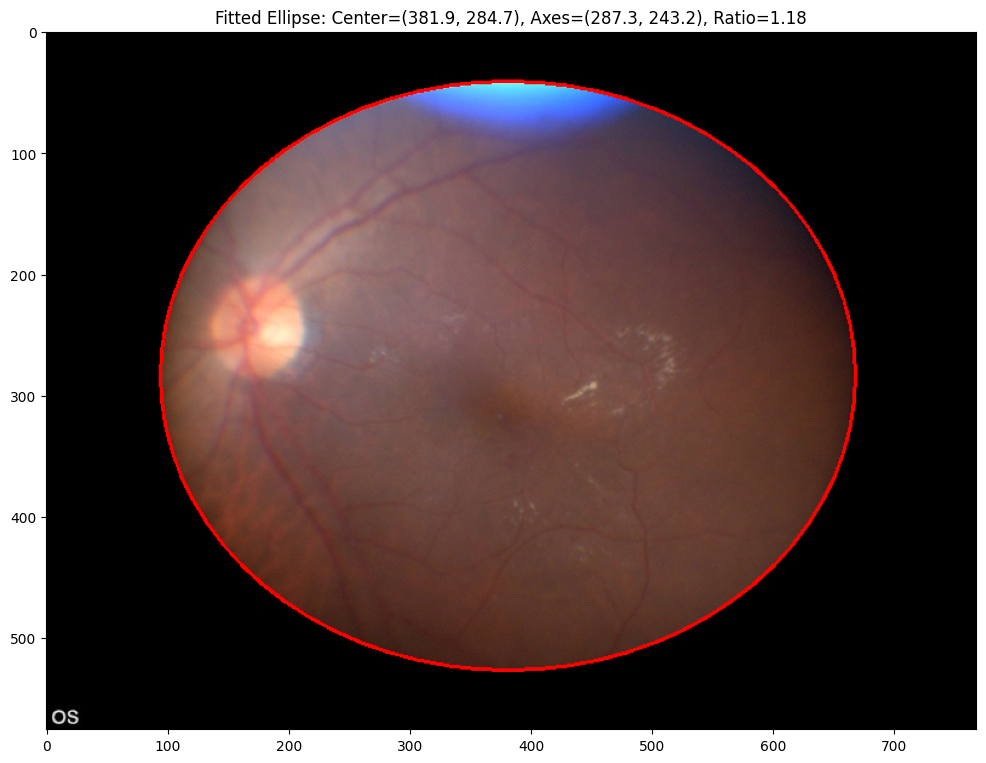

Elliptical boundary detected, correcting aspect ratio...
Stretching vertical axis by factor of 1.18


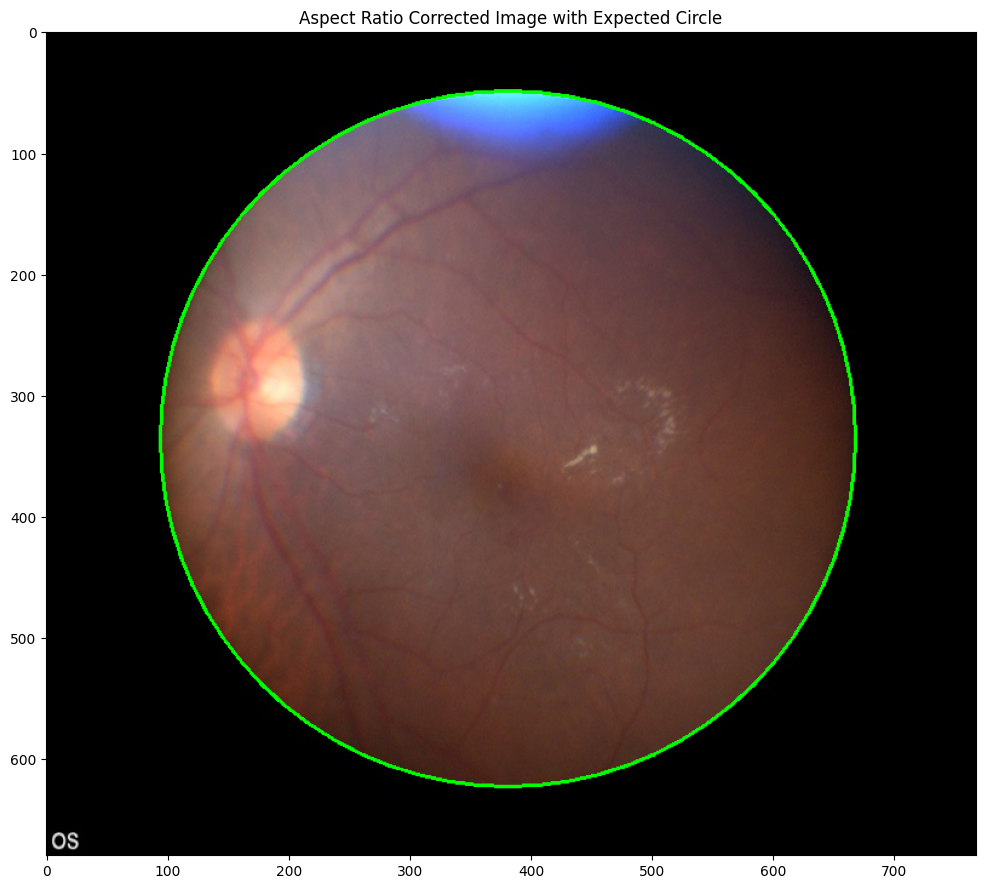

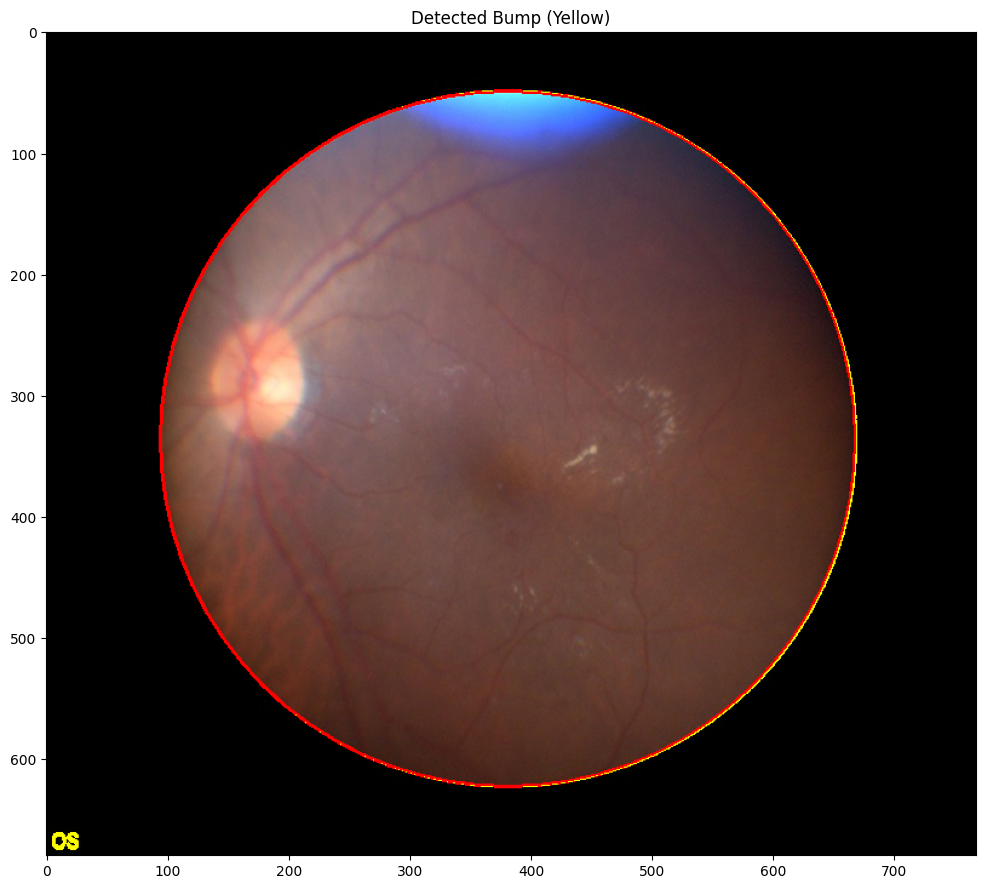

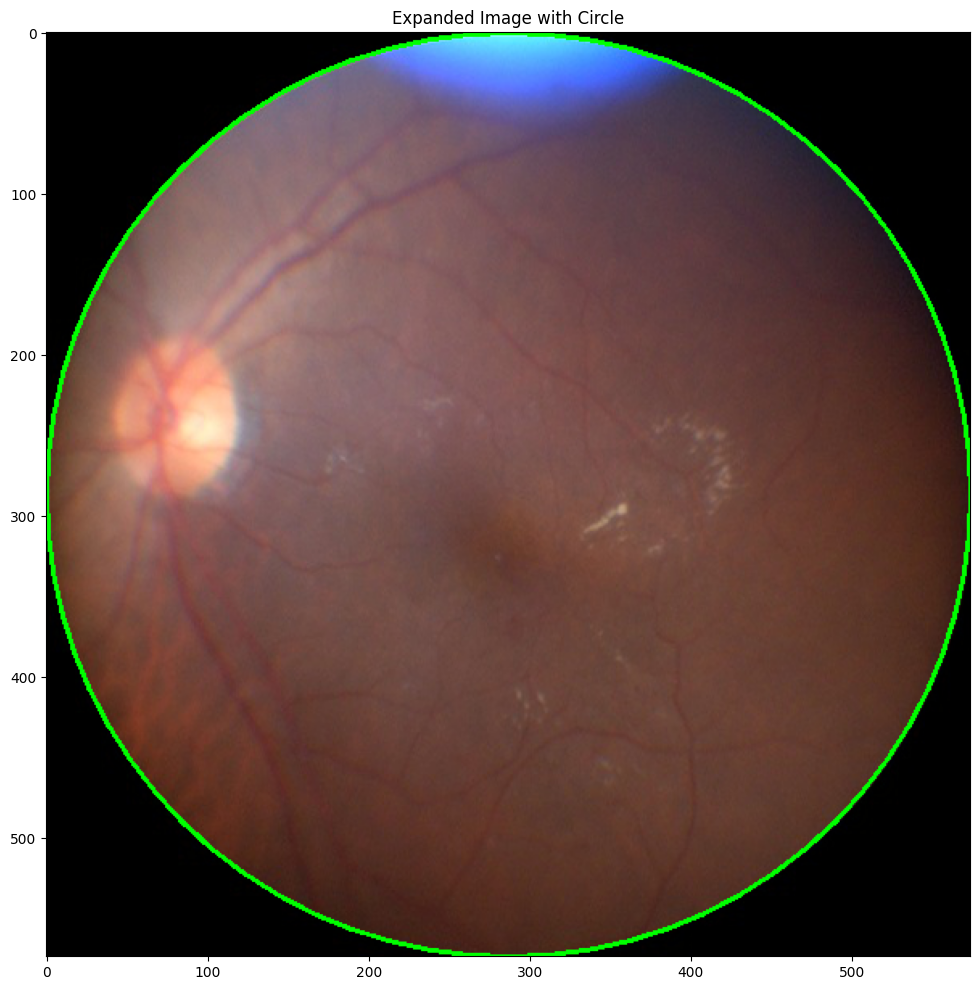

(array([[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        ...,
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]]], dtype=uint8),
 (287.2830543814112, 287.2830543814112, 287.2830543814112))

In [38]:
process_retina_image("aptos2019-blindness-detection/test_images/25d98da73248.png",
                     "aptos2019-blindness-detection/test_images-difficult-processed/25d98da73248.png",
                     debug=True)

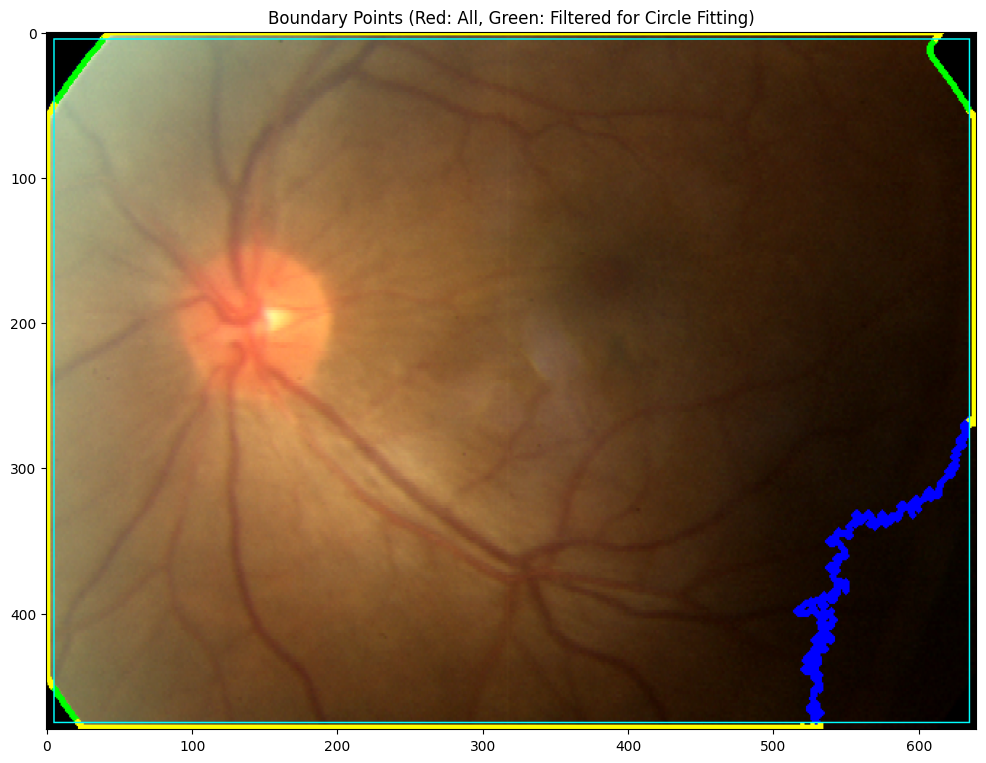

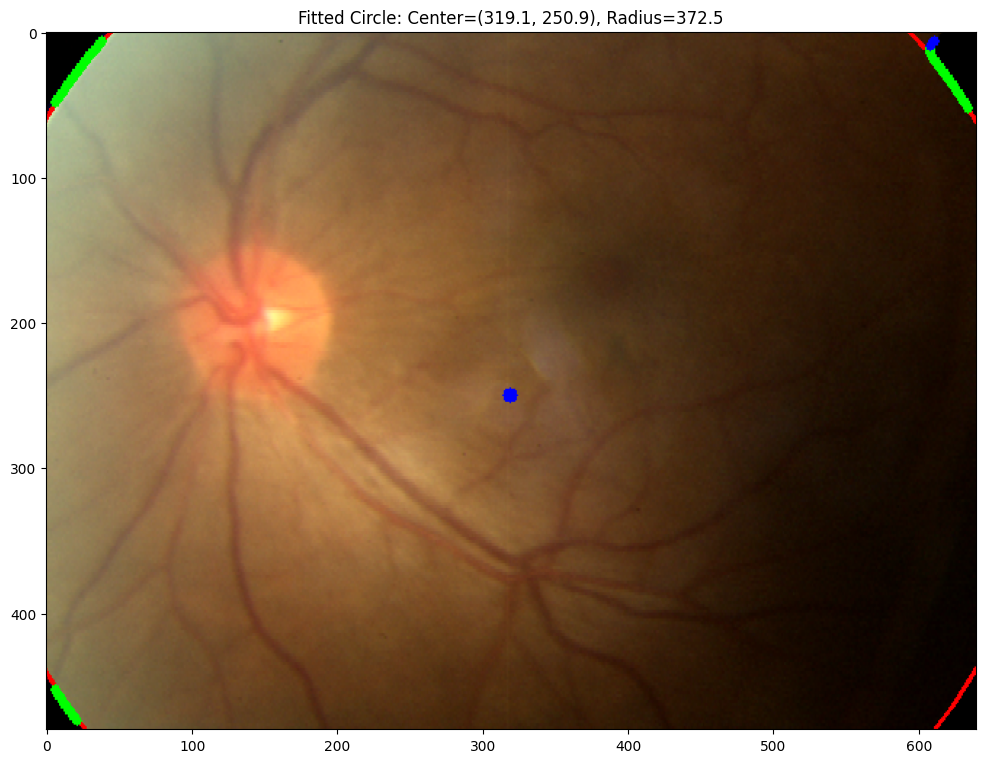

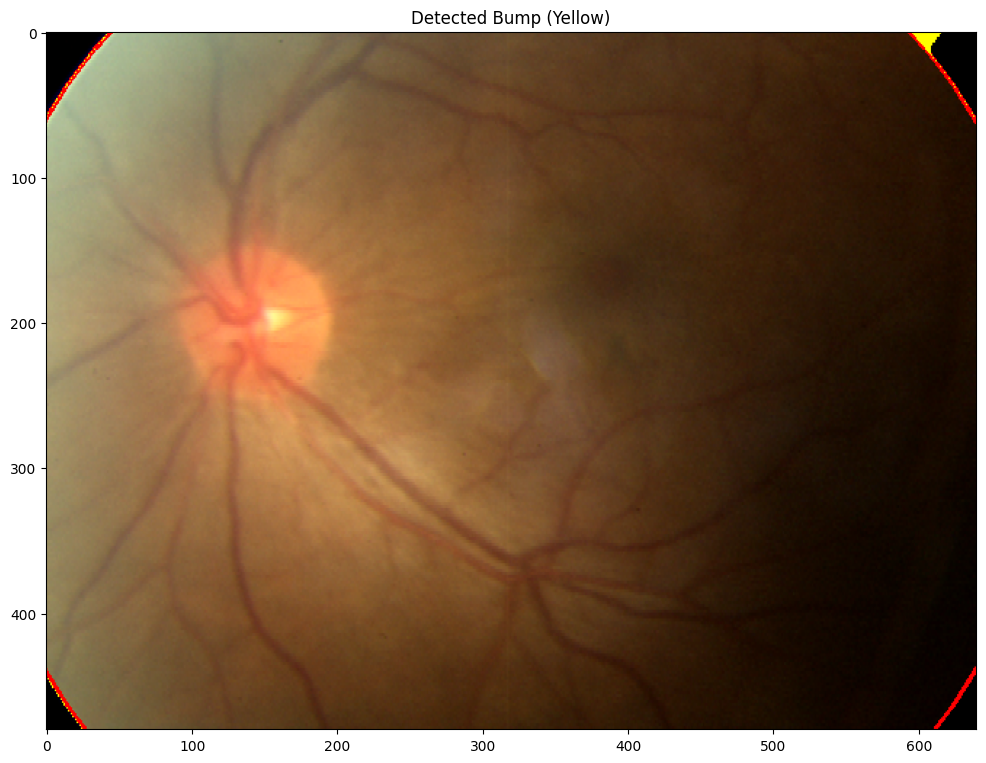

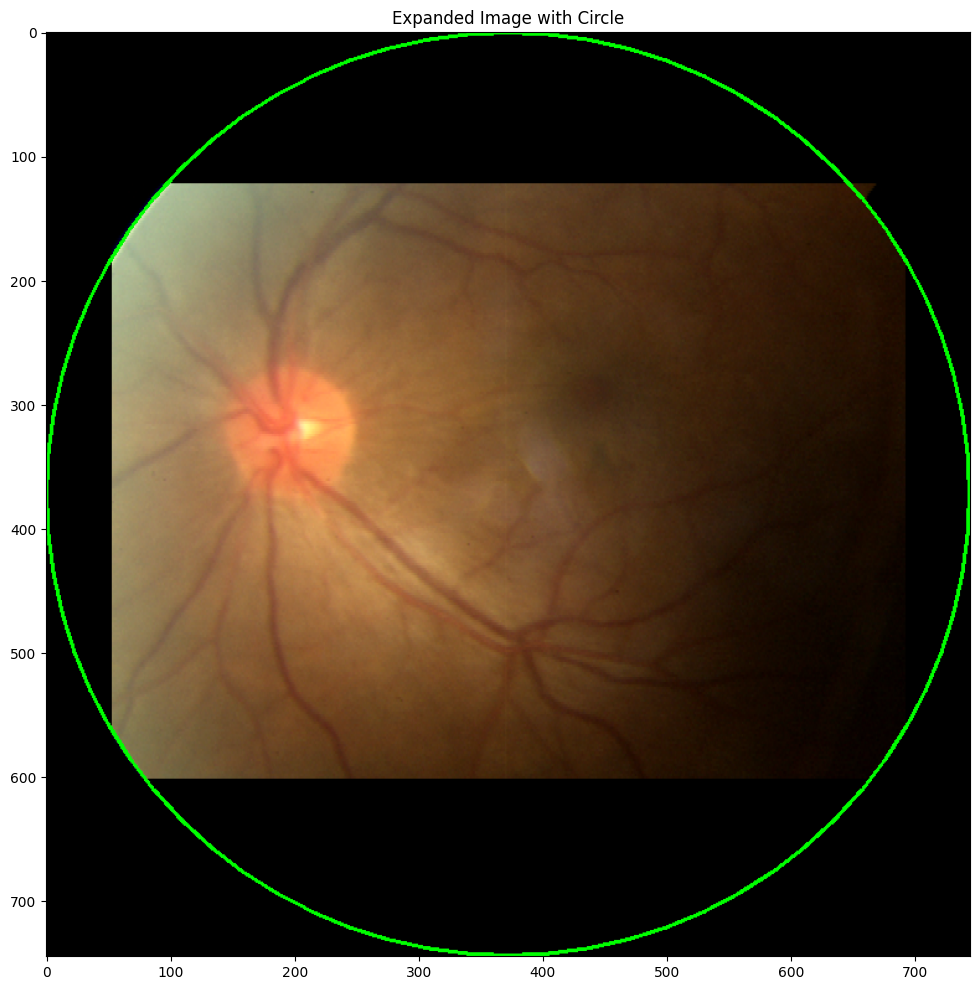

(array([[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        ...,
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]]], dtype=uint8),
 (372.5290670829693, 372.5290670829693, 372.5290670829693))

In [26]:
process_retina_image("aptos2019-blindness-detection/test_images/326f05b4fef0.png",
                     "aptos2019-blindness-detection/test_images-difficult-processed/326f05b4fef0.png",
                     debug=True, excluded_quadrants=[3])

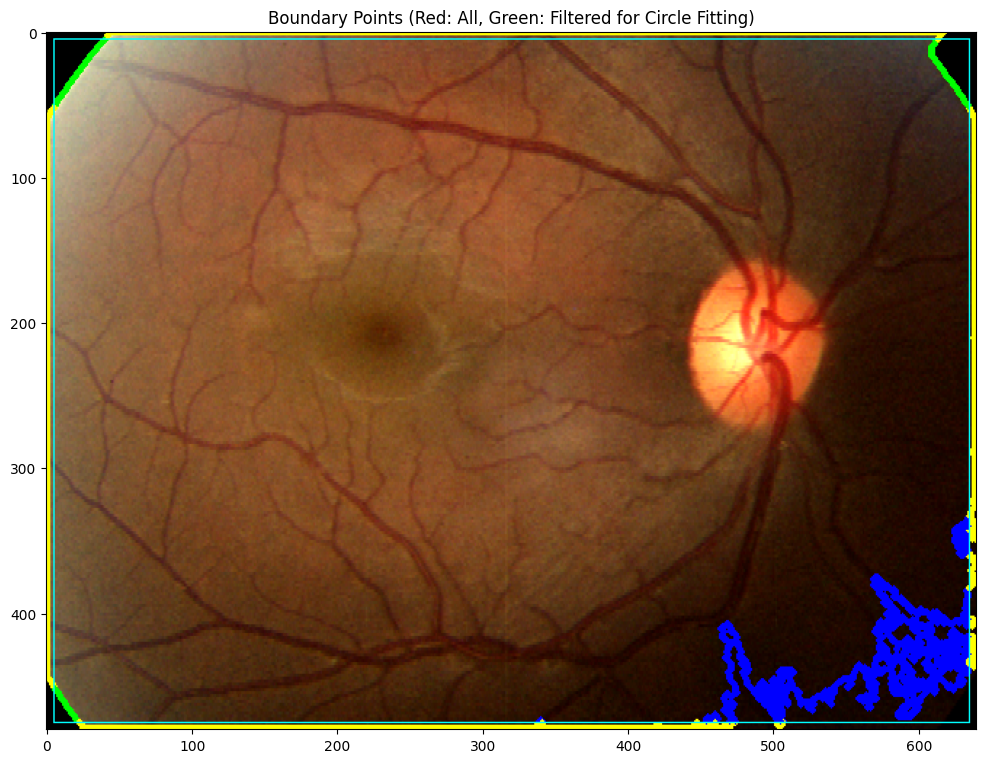

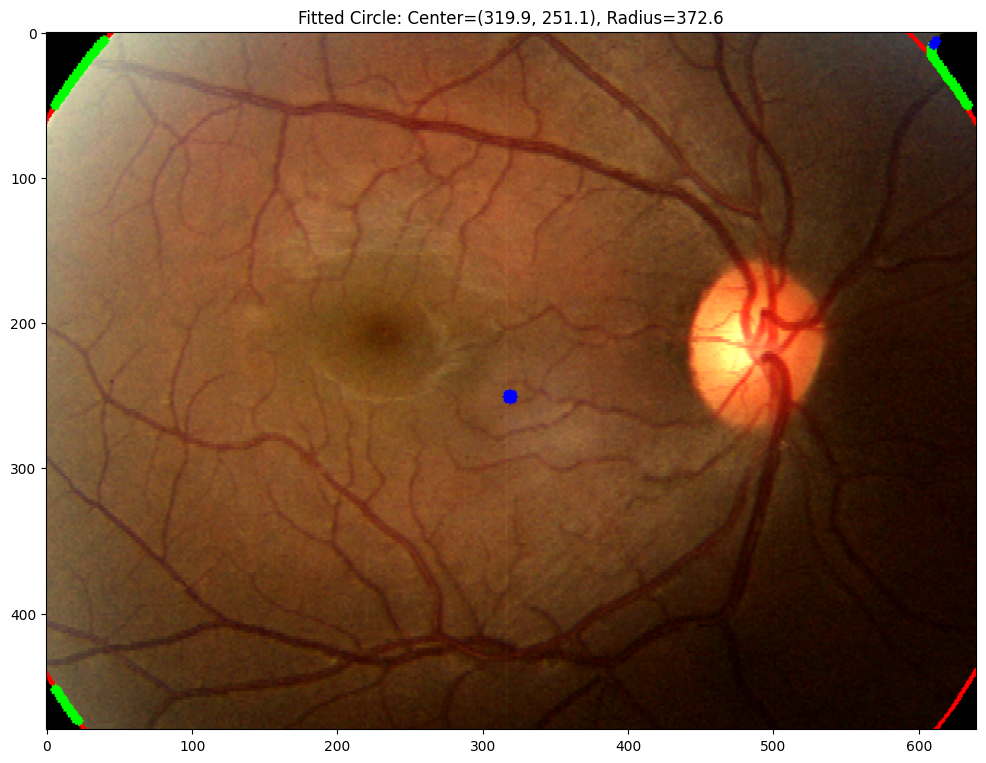

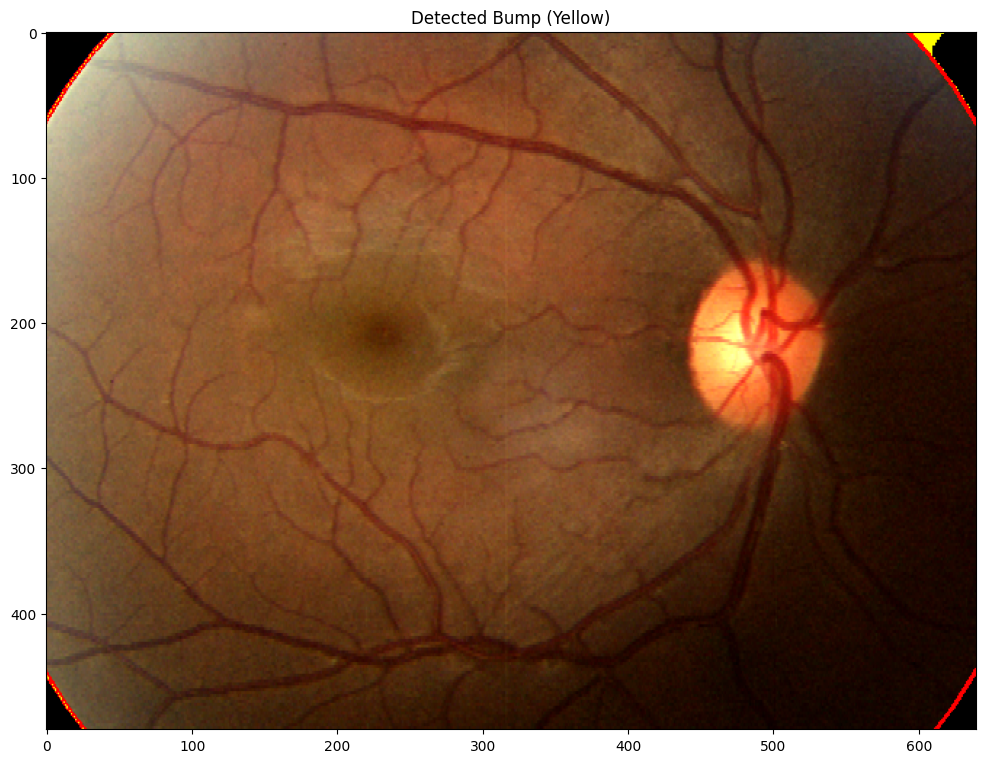

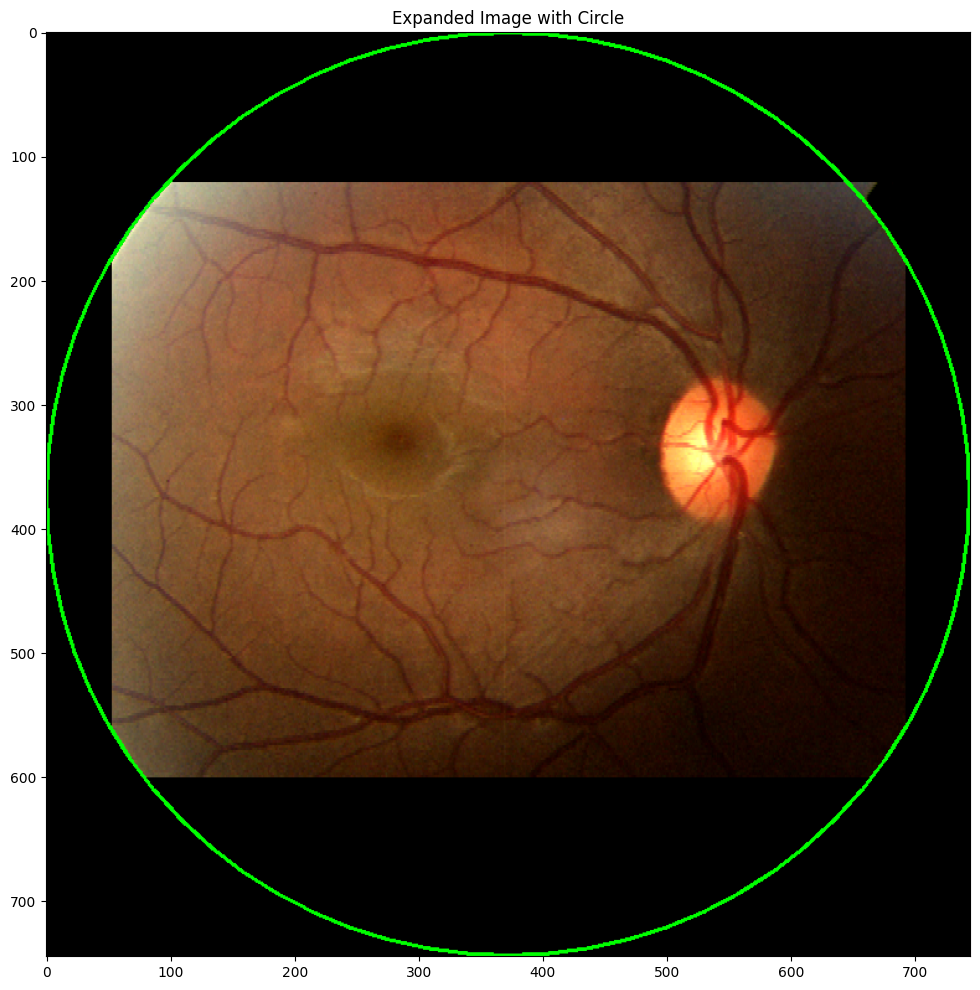

(array([[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        ...,
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]]], dtype=uint8),
 (372.56213546056625, 372.56213546056625, 372.56213546056625))

In [30]:
process_retina_image("aptos2019-blindness-detection/test_images/acb0e59ebfcd.png",
                     "aptos2019-blindness-detection/test_images-difficult-processed/acb0e59ebfcd.png",
                     debug=True, excluded_quadrants=[3])

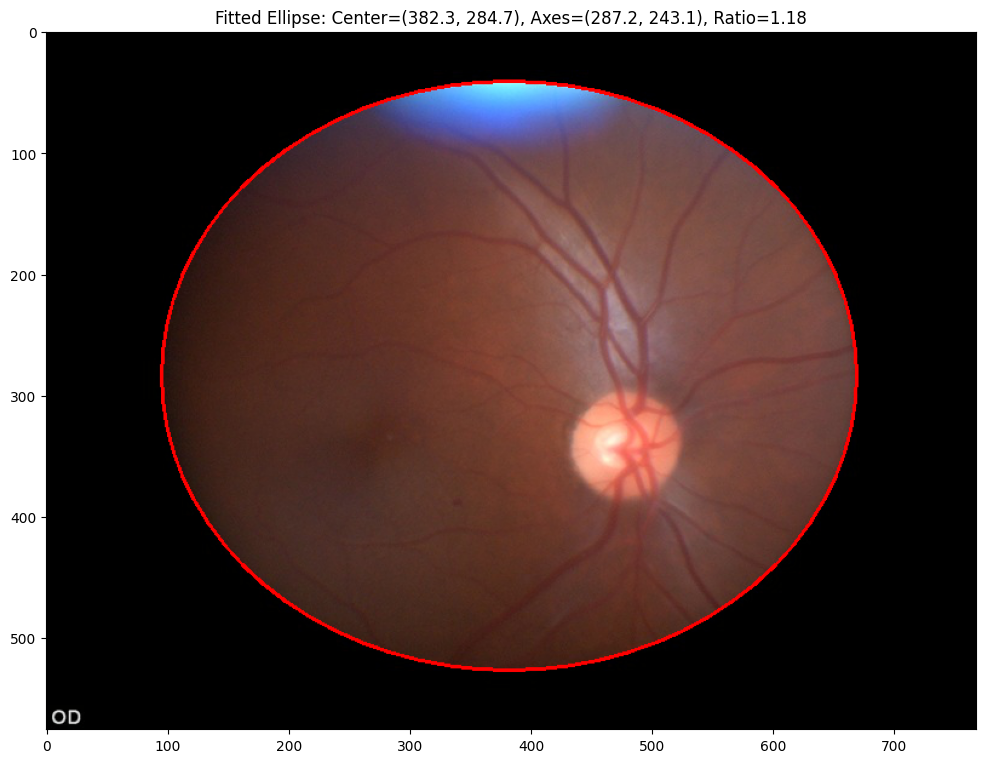

Elliptical boundary detected, correcting aspect ratio...
Stretching vertical axis by factor of 1.18


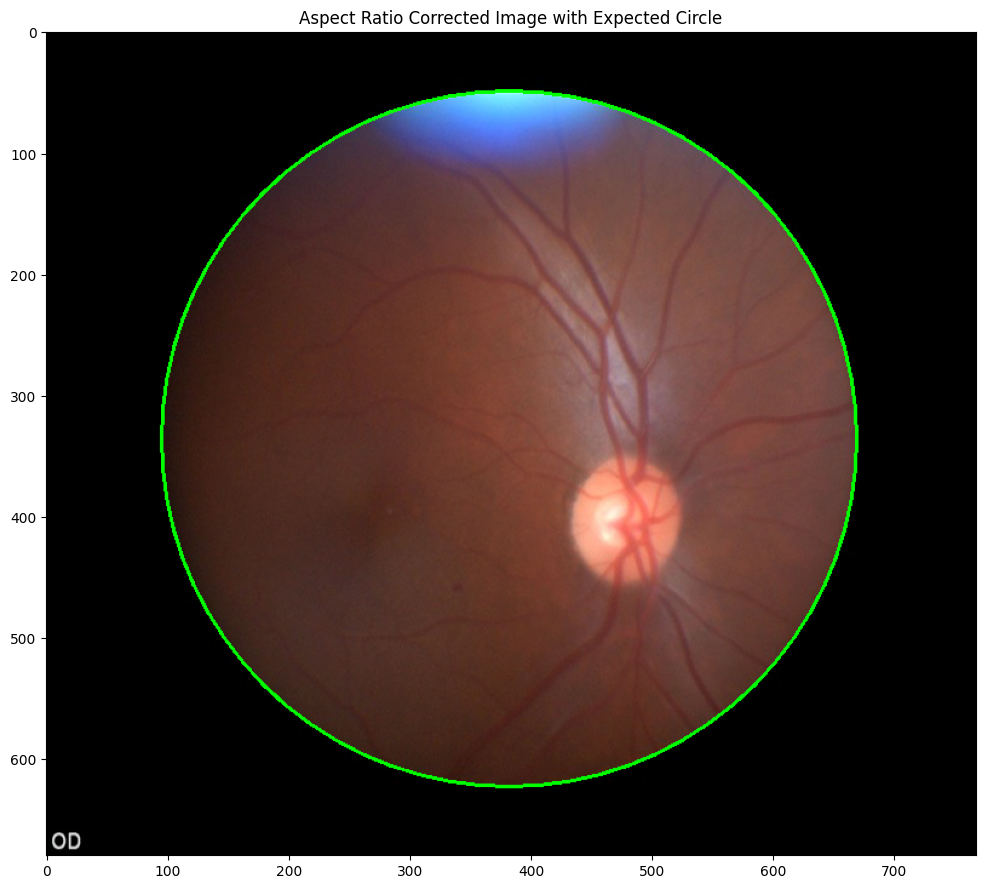

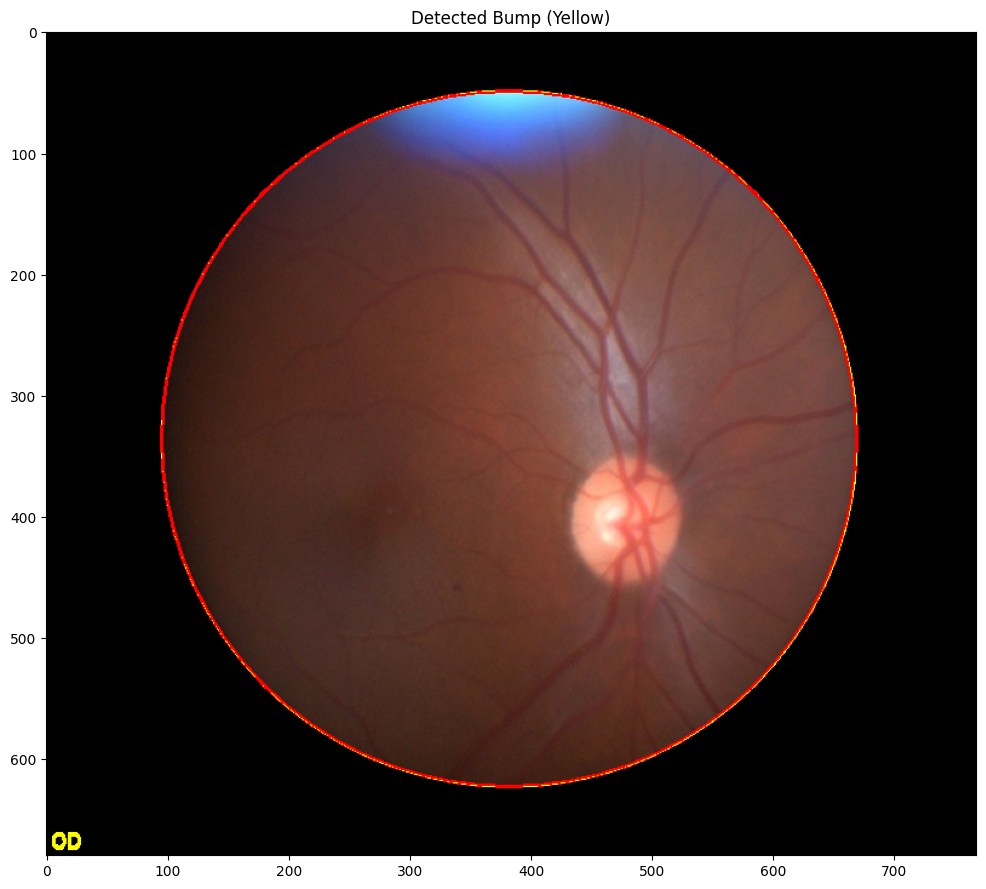

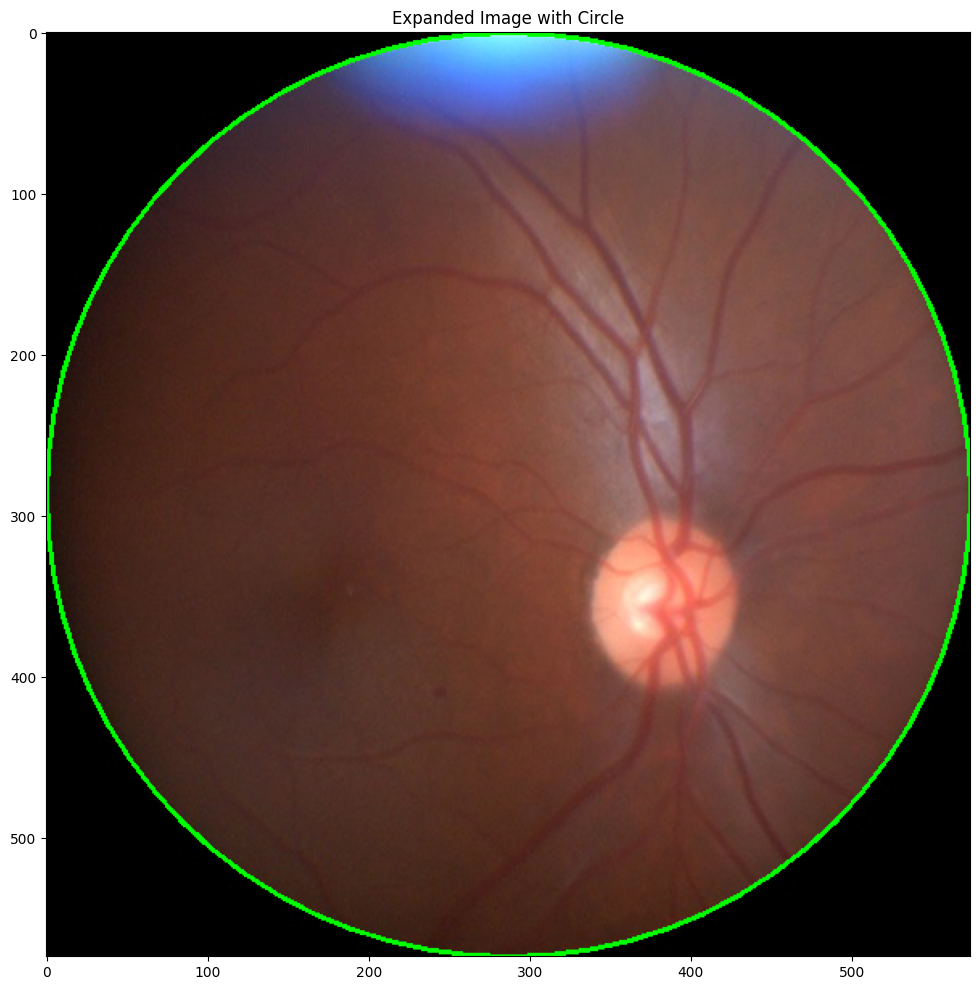

(array([[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        ...,
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]]], dtype=uint8),
 (287.2303165322238, 287.2303165322238, 287.2303165322238))

In [42]:
process_retina_image("aptos2019-blindness-detection/test_images/d8468d108c02.png",
                     "aptos2019-blindness-detection/test_images-difficult-processed/d8468d108c02.png",
                     debug=True)

In [44]:
from pathlib import Path

# Define the directories
dir1 = Path("aptos2019-blindness-detection/test_images")
dir2 = Path("aptos2019-blindness-detection/test_images-processed")

# Get sets of filenames (not full paths)
files1 = {f.name for f in dir1.iterdir() if f.is_file()}
files2 = {f.name for f in dir2.iterdir() if f.is_file()}

# Compute differences
only_in_dir1 = files1 - files2
only_in_dir2 = files2 - files1

# Print results
print("Files only in dir1:")
for f in sorted(only_in_dir1):
    print(f)

print("\nFiles only in dir2:")
for f in sorted(only_in_dir2):
    print(f)

Files only in dir1:

Files only in dir2:


In [ ]:
from PIL import Image
from tqdm.notebook import tqdm

# Output directory
processed_dir = train_imgs_dir / "processed"
processed_dir.mkdir(parents=True, exist_ok=True)

# Process and save
for _, row in tqdm(train_labels.iterrows(), total=len(train_labels)):
    img_id = row['id_code']
    img_path = train_imgs_dir / f"{img_id}.png"
    
    # Load and transform
    img = Image.open(img_path).convert("RGB")
    processed_img = trim_and_pad(img)  # Already returns a PIL image

    # Save
    processed_img.save(processed_dir / f"{img_id}.png")

100%|██████████| 3662/3662 [32:26<00:00,  1.88it/s] 


In [8]:
from PIL import Image
from tqdm.notebook import tqdm

# Output directory
processed_dir = test_imgs_dir / "processed"
processed_dir.mkdir(parents=True, exist_ok=True)

# Process and save
for _, row in tqdm(train_labels.iterrows(), total=len(train_labels)):
    img_id = row['id_code']
    img_path = test_imgs_dir / f"{img_id}.png"
    
    # Load and transform
    img = Image.open(img_path).convert("RGB")
    processed_img = trim_and_pad(img)  # Already returns a PIL image

    # Save
    processed_img.save(processed_dir / f"{img_id}.png")

  0%|          | 0/35126 [00:00<?, ?it/s]

KeyError: 'id_code'

.

In [1]:
from pathlib import Path
import pandas as pd

data_root = Path('diabetic-retinopathy-detection')

train_imgs_dir = data_root / 'train'
test_imgs_dir = data_root / 'test'

train_labels = pd.read_csv(data_root / 'trainLabels.csv')
test_imgs_dirs = test_imgs_dir.glob("*.jpeg")

In [12]:
len('diabetic-retinopathy-detection/test/')

36

In [ ]:
# from PIL import Image
# from tqdm import tqdm

# # Output directory
# processed_dir = train_imgs_dir / "processed"
# processed_dir.mkdir(parents=True, exist_ok=True)

# # Process and save
# for _, row in tqdm(train_labels.iterrows(), total=len(train_labels)):
#     img_id = row['image']
#     img_path = train_imgs_dir / f"{img_id}.jpeg"
    
#     # Load and transform
#     img = Image.open(img_path).convert("RGB")
#     processed_img = trim_and_pad(img)  # Already returns a PIL image

#     # Save
#     processed_img.save(processed_dir / f"{img_id}.jpeg")

  0%|          | 0/35126 [00:00<?, ?it/s]

100%|██████████| 35126/35126 [3:09:36<00:00,  3.09it/s]  


In [ ]:
from joblib import Parallel, delayed
from PIL import Image

# Output directory
processed_dir = train_imgs_dir / "processed"
processed_dir.mkdir(parents=True, exist_ok=True)

# Assume train_imgs_dir, processed_dir, train_labels, and trim_and_pad are defined
def process_image(img_id):
    img_path = train_imgs_dir / f"{img_id}.jpeg"
    img = Image.open(img_path).convert("RGB")
    processed_img = trim_and_pad(img)
    processed_img.save(processed_dir / f"{img_id}.jpeg")

img_ids = train_labels['image'].tolist()
n_instances = 6  # Adjust based on your system's CPU cores, e.g., 4 for quad-core

Parallel(n_jobs=n_instances)(delayed(process_image)(img_id) for img_id in img_ids)

In [3]:
from joblib import Parallel, delayed
from PIL import Image

# Output directory
processed_dir = test_imgs_dir / "processed"
processed_dir.mkdir(parents=True, exist_ok=True)

# Assume test_imgs_dir, processed_dir, test_imgs_dirs, and trim_and_pad are defined
def process_image(img_id):
    img_path = test_imgs_dir / f"{img_id}.jpeg"
    img = Image.open(img_path).convert("RGB")
    processed_img = trim_and_pad(img)
    processed_img.save(processed_dir / f"{img_id}.jpeg")

img_ids = [str(filename)[36:-5] for filename in test_imgs_dirs]
n_instances = 6  # Adjust based on your system's CPU cores, e.g., 4 for quad-core

Parallel(n_jobs=n_instances)(delayed(process_image)(img_id) for img_id in img_ids)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

In [ ]:
# from pathlib import Path
# import pandas as pd
# from tqdm.notebook import tqdm
# from concurrent.futures import ProcessPoolExecutor

# # Function to process a chunk of images
# def process_image_batch(df_chunk, processed_dir_str, train_imgs_dir_str):
#     from PIL import Image
#     import os

#     processed_dir = Path(processed_dir_str)
#     train_imgs_dir = Path(train_imgs_dir_str)

#     for _, row in df_chunk.iterrows():
#         img_id = row['image']
#         img_path = train_imgs_dir / f"{img_id}.jpeg"
#         try:
#             img = Image.open(img_path).convert("RGB")
#             processed_img = trim_and_pad(img)  # trim_and_pad must be globally defined
#             processed_img.save(processed_dir / f"{img_id}.jpeg")
#         except Exception as e:
#             print(f"Error processing {img_id}: {e}")

# # Function to split data and run multiprocessing
# def run_parallel_processing(n_instances):
#     processed_dir = train_imgs_dir / "processed"
#     processed_dir.mkdir(parents=True, exist_ok=True)

#     chunks = [train_labels.iloc[i::n_instances] for i in range(n_instances)]
#     processed_dir_str = str(processed_dir)
#     train_imgs_dir_str = str(train_imgs_dir)

#     with ProcessPoolExecutor(max_workers=n_instances) as executor:
#         futures = []
#         for chunk in chunks:
#             futures.append(executor.submit(process_image_batch, chunk, processed_dir_str, train_imgs_dir_str))

#         # Optional: wait and raise any exceptions
#         for future in tqdm(futures):
#             future.result()

# # Run it
# run_parallel_processing(n_instances=4)


In [ ]:
from PIL import Image
from tqdm.notebook import tqdm

# Output directory
processed_dir = test_imgs_dir / "processed"
processed_dir.mkdir(parents=True, exist_ok=True)

# Process and save
for img_path in tqdm(test_imgs_dir.glob("*.jpeg")):
    img_id = img_path.stem  # Get the filename without extension
    
    # Load and transform
    img = Image.open(img_path).convert("RGB")
    processed_img = trim_and_pad(img)  # Already returns a PIL image

    # Save
    processed_img.save(processed_dir / f"{img_id}.jpeg")

25it [00:07,  3.53it/s]


KeyboardInterrupt: 

.

In [8]:
import pandas as pd
import numpy as np
import re

# Load the dataframe (if not already loaded)
# train_labels = pd.read_csv('path_to_your_train_labels.csv')

# Sanity check: Ensure consecutive pairs match in numeric part and are left/right
def is_valid_pair(row1, row2):
    match1 = re.match(r"(\d+)_(left|right)", row1)
    match2 = re.match(r"(\d+)_(left|right)", row2)
    return (
        match1 is not None and match2 is not None and
        match1.group(1) == match2.group(1) and
        match1.group(2) != match2.group(2)
    )

valid = True
for i in range(0, len(train_labels), 2):
    if i + 1 >= len(train_labels):
        valid = False
        print(f"Odd number of rows, last row at index {i} has no pair.")
        break
    row1 = train_labels.iloc[i]['image']
    row2 = train_labels.iloc[i + 1]['image']
    if not is_valid_pair(row1, row2):
        valid = False
        print(f"Invalid pair found at rows {i} and {i + 1}: {row1}, {row2}")
        break

if not valid:
    print("Aborting: train_labels does not have valid consecutive left/right pairs.")
else:
    # Randomly select one image from each left/right pair
    selected_rows = [
        train_labels.iloc[i + np.random.randint(2)]
        for i in range(0, len(train_labels), 2)
    ]

    train_labels_half = pd.DataFrame(selected_rows)
    train_labels_half.to_csv(data_root / 'trainLabelsHalf.csv', index=False)
    print("Saved trainLabelsHalf.csv with one randomly selected image from each pair.")

Saved trainLabelsHalf.csv with one randomly selected image from each pair.


===========================================================

In [75]:
import torch
import torch.nn.functional as F
from torch.utils.data import random_split, DataLoader, Dataset
from torchvision import transforms
from PIL import Image

import timm
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
from torch.optim.lr_scheduler import StepLR

/home/mauribuntu/miniconda3/envs/causal-dl-torch/lib/python3.12/site-packages/transformers/utils/generic.py:441: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(
/home/mauribuntu/miniconda3/envs/causal-dl-torch/lib/python3.12/site-packages/transformers/utils/generic.py:309: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(
/home/mauribuntu/miniconda3/envs/causal-dl-torch/lib/python3.12/site-packages/transformers/utils/generic.py:309: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(


In [ ]:
# 2.1 Define the ImageNet‐style transforms for EfficientNet
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std =[0.229, 0.224, 0.225]
    ),
])

# 2.2 If your dataset has no built-in transform, wrap it:
class WrappedDataset(Dataset):
    def __init__(self, base_ds, transform):
        self.base = base_ds
        self.transform = transform
    def __len__(self):
        return len(self.base)
    def __getitem__(self, i):
        img, label = self.base[i]
        # if img is a PIL image, convert; if tensor, just apply transform
        if isinstance(img, Image.Image):
            img = self.transform(img)
        else:
            img = self.transform(img)
        return img, label

# Replace train_dataset with our wrapped version if needed:
try:
    # if train_dataset already applies transforms, this is a no-op
    train_dataset.transform = transform
    dataset = train_dataset
except Exception:
    dataset = WrappedDataset(train_dataset, transform)

# 2.3 Train/val split (80/20)
train_len = int(0.8 * len(dataset))
val_len   = len(dataset) - train_len
train_ds, val_ds = random_split(dataset, [train_len, val_len])

# 2.4 Dataloaders
batch_size = 32
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True,  num_workers=10)
val_loader   = DataLoader(val_ds,   batch_size=batch_size, shuffle=False, num_workers=10)